# Wine Quality Prediction

Dataset from https://archive.ics.uci.edu/ml/datasets/Wine+Quality

# Importing Libraries

In [2]:
pip install imblearn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 226.0/226.0 kB 3.9 MB/s eta 0:00:00a 0:00:01
  Using cached joblib-1.2.0-py3-none-any.whl (297 kB)
  Attempting uninstall: joblib
    Found existing installation: joblib 1.1.0
    Uninstalling joblib-1.1.0:
      Successfully uninstalled joblib-1.1.0

[notice] A new release of pip is available: 23.0.1 -> 23.1.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install xgboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 14.9 MB/s eta 0:00:00 0:00:01

[notice] A new release of pip is available: 23.0.1 -> 23.1.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [60]:
pip install ydata-profiling


[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [1]:
import warnings

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from ydata_profiling import ProfileReport
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
from imblearn.over_sampling import ADASYN, SMOTE, BorderlineSMOTE, RandomOverSampler
from sklearn.model_selection import  train_test_split,StratifiedKFold,cross_val_score
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier, GradientBoostingClassifier
from sklearn.feature_selection import SelectKBest, f_classif  # ANOVA
from sklearn.linear_model import LogisticRegression, LinearRegression
from xgboost import XGBClassifier
from sklearn.metrics import (
    accuracy_score,
    log_loss,
    classification_report,
    f1_score,
    precision_score,
    recall_score,
    make_scorer,
    cohen_kappa_score
)
from sklearn import metrics
from sklearn.model_selection import GridSearchCV, cross_val_score, train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.utils import class_weight

%matplotlib inline

# Organizing Data

In [5]:
wine_data = pd.read_csv("https://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/winequality-white.csv", delimiter = ';')

In [6]:
wine_data.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [8]:
wine_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         4898 non-null   float64
 1   volatile acidity      4898 non-null   float64
 2   citric acid           4898 non-null   float64
 3   residual sugar        4898 non-null   float64
 4   chlorides             4898 non-null   float64
 5   free sulfur dioxide   4898 non-null   float64
 6   total sulfur dioxide  4898 non-null   float64
 7   density               4898 non-null   float64
 8   pH                    4898 non-null   float64
 9   sulphates             4898 non-null   float64
 10  alcohol               4898 non-null   float64
 11  quality               4898 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 459.3 KB


In [9]:
import pandas as pd
from ydata_profiling import ProfileReport

profile = ProfileReport(wine_data)
profile.to_notebook_iframe()




Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Exploratory Data Analysis

In [10]:
wine_data.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

Organising the data

Making copy of the original data to modify the data for example changing the wattage scale of the quality characteristic

In [11]:
wine_data = wine_data.copy()
wine_data["quality"] = wine_data["quality"] - 3
wine_data.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,3
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,3
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,3
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,3
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,3


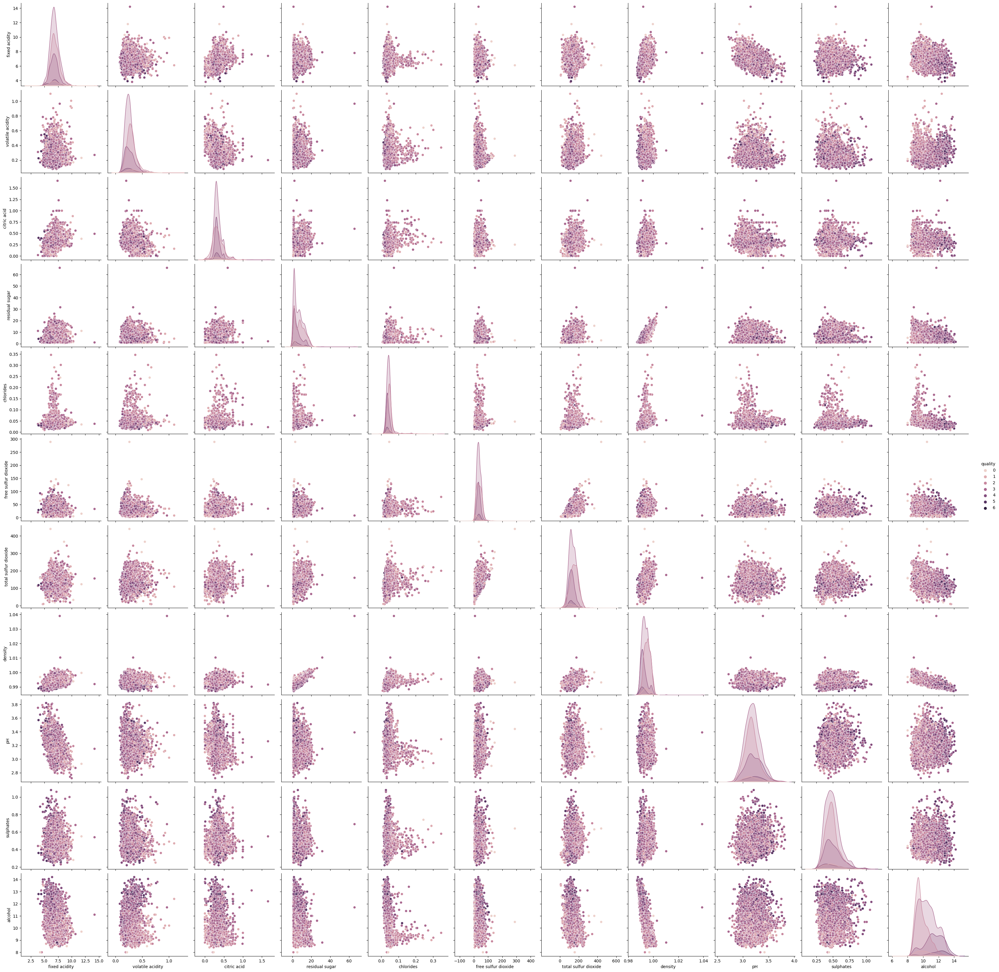

In [30]:
#Using Pairplot to get knowledge about data
sns.pairplot(wine_data,hue='quality',height=3)

# Plotting Histograms 

<AxesSubplot: xlabel='fixed acidity', ylabel='Count'>

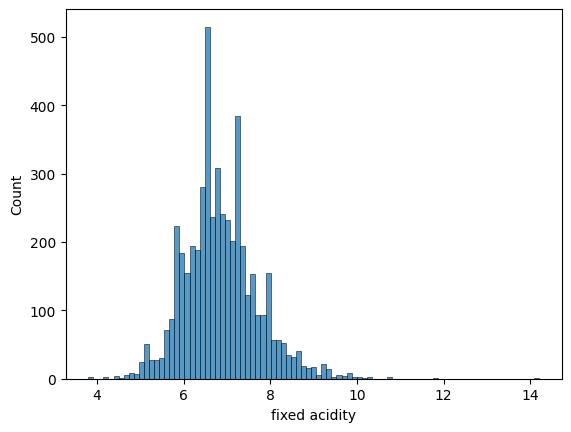

In [32]:
sns.histplot(x=wine_data['fixed acidity'])

<AxesSubplot: xlabel='volatile acidity', ylabel='Count'>

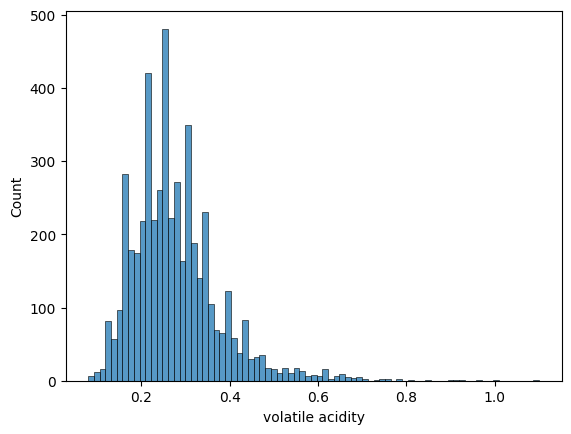

In [33]:
sns.histplot(x=wine_data['volatile acidity'])

In [46]:
#Removing Outliers
wine_data.drop(wine_data[wine_data['volatile acidity'] >= 0.6].index, inplace = True)

<AxesSubplot: xlabel='citric acid', ylabel='Count'>

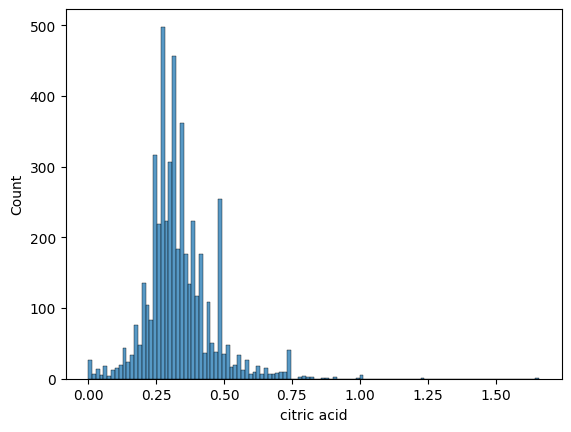

In [34]:
sns.histplot(x=wine_data['citric acid'])

In [48]:
#Removing Outliers
wine_data.drop(wine_data[wine_data['citric acid'] >= 0.75].index, inplace = True)

<AxesSubplot: xlabel='residual sugar', ylabel='Count'>

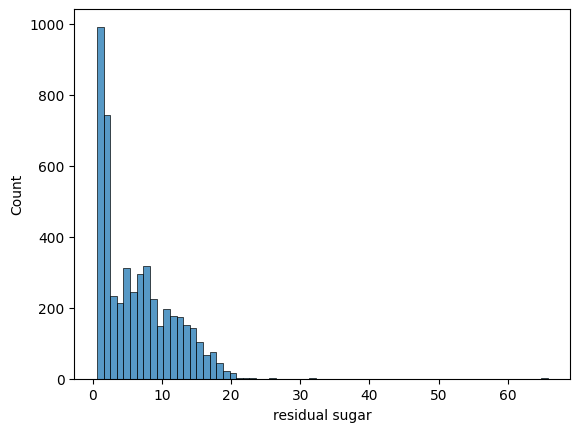

In [35]:
sns.histplot(x=wine_data['residual sugar'])

<AxesSubplot: xlabel='chlorides', ylabel='Count'>

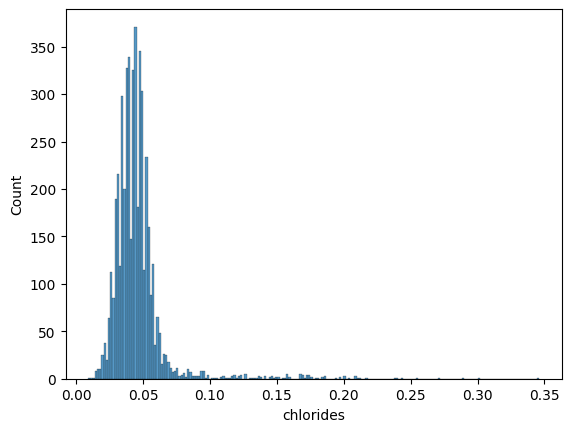

In [36]:
sns.histplot(x=wine_data['chlorides'])

In [50]:
#Removing Outliers
wine_data.drop(wine_data[wine_data['chlorides'] >= 0.10].index, inplace = True)

<AxesSubplot: xlabel='free sulfur dioxide', ylabel='Count'>

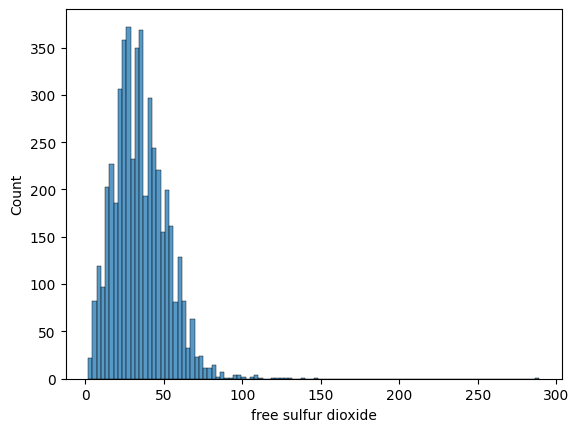

In [37]:
sns.histplot(x=wine_data['free sulfur dioxide'])

<AxesSubplot: xlabel='total sulfur dioxide', ylabel='Count'>

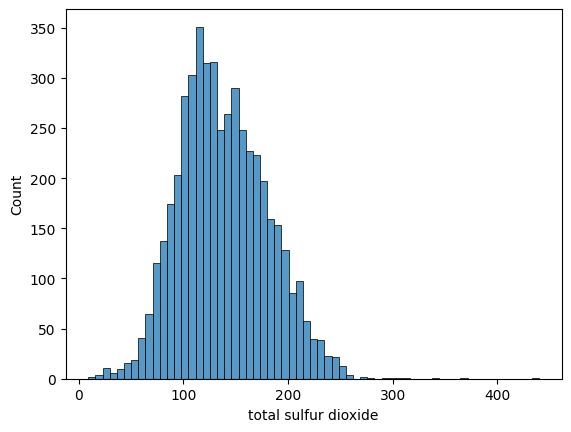

In [38]:
sns.histplot(x=wine_data['total sulfur dioxide'])

<AxesSubplot: xlabel='density', ylabel='Count'>

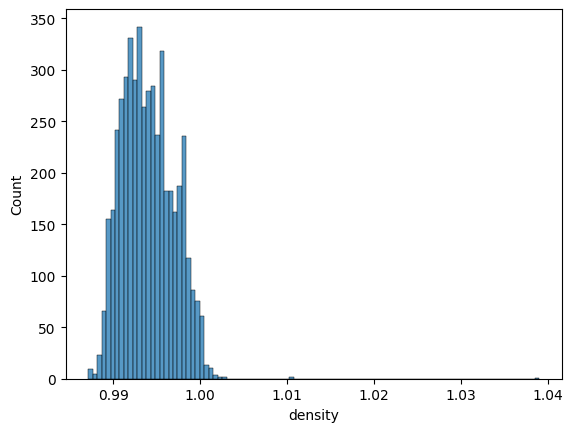

In [39]:
sns.histplot(x=wine_data['density'])

<AxesSubplot: xlabel='pH', ylabel='Count'>

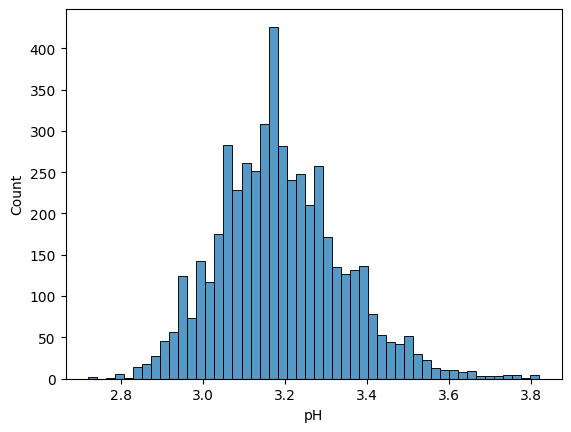

In [40]:
sns.histplot(x=wine_data['pH'])

<AxesSubplot: xlabel='sulphates', ylabel='Count'>

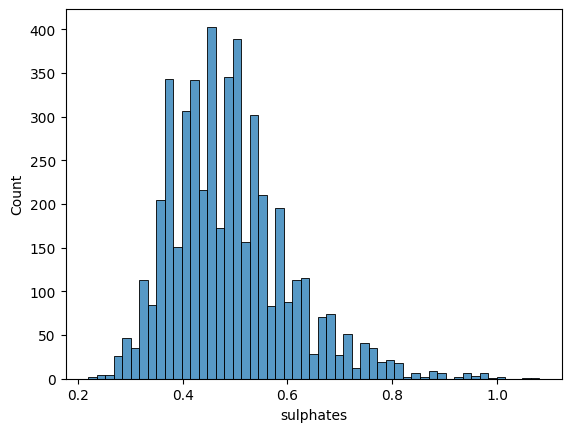

In [41]:
sns.histplot(x=wine_data['sulphates'])

<AxesSubplot: xlabel='alcohol', ylabel='Count'>

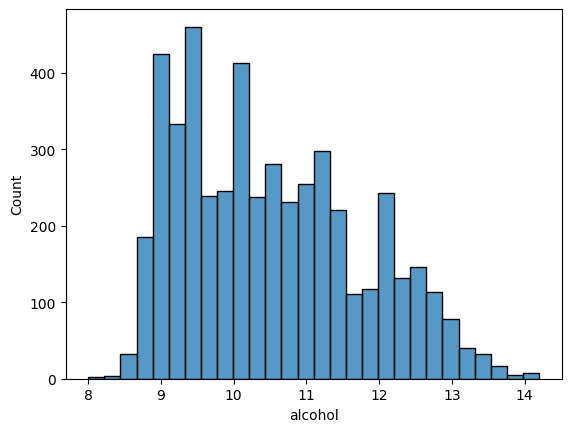

In [42]:
sns.histplot(x=wine_data['alcohol'])

In [51]:
wine_data.describe()[1:].style.background_gradient()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
mean,6.882710,0.221706,0.340641,6.373381,0.043161,36.612311,136.550113,0.994093,3.192014,0.492462,10.446992,2.961972
std,0.838221,0.045386,0.097951,5.159636,0.010710,17.229540,41.187544,0.002886,0.157535,0.116689,1.107380,0.835911
min,3.900000,0.080000,0.000000,0.600000,0.012000,2.000000,18.000000,0.987110,2.720000,0.220000,8.000000,0.000000
25%,6.300000,0.190000,0.280000,1.600000,0.036000,25.000000,107.000000,0.991800,3.080000,0.410000,9.500000,2.000000
50%,6.800000,0.230000,0.320000,5.000000,0.043000,35.000000,132.000000,0.993800,3.180000,0.470000,10.400000,3.000000
75%,7.400000,0.260000,0.390000,10.100000,0.050000,47.000000,164.000000,0.996100,3.290000,0.550000,11.200000,3.000000
max,14.200000,0.295000,0.740000,23.500000,0.098000,289.000000,440.000000,1.002410,3.820000,1.080000,14.000000,6.000000


In [52]:
wine_data.nunique().sort_values(ascending=True)

quality                   7
volatile acidity         42
fixed acidity            62
citric acid              65
sulphates                75
chlorides                82
alcohol                  84
pH                       99
free sulfur dioxide     120
total sulfur dioxide    228
residual sugar          267
density                 714
dtype: int64

# Box Plot

Box plot displays the shape of the data, variability and the median information.
It shows following point of data:

1.Minimum Range

2.Lower Quartile

3.Median

4.Upper Quartile

5.Maximum Range

6.Minimum Score

7.Maximum Score

1.Minimum score: is the lowest score excluding outliers.

2.Lower Quartile: 25% of all variables fall below the lower quartile value.

3.Median is the mid-point of the data.

4.Upper Quartile: is 75% of all variables that fall below the upper quartile value.

5.Maximum score: is the highest score, excluding outliers.

6.Interquartile Range (IQR): ranges between the 25th and 75th percentile.
   IQR = Q3 – Q1

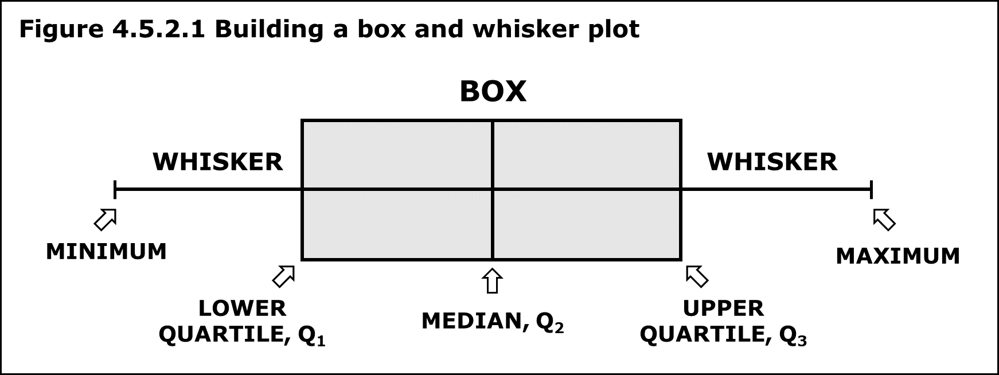

Text(0.5, 0.98, 'Visualizing columns')

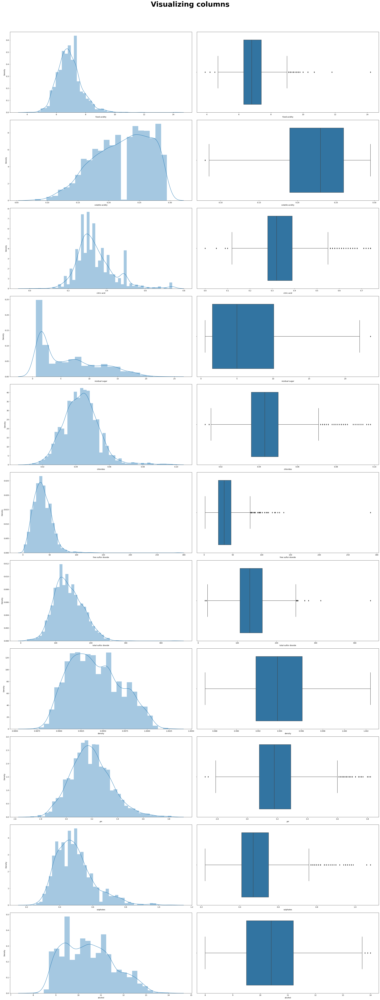

In [53]:
 warnings.filterwarnings("ignore")

fig, ax = plt.subplots(11, 2, figsize=(30, 80))

# Exclusion of the `quality` feature by considering only the variable "float64"
for index, i in enumerate(wine_data.select_dtypes(include=["float64"]).columns):
    sns.distplot(wine_data[i], ax=ax[index, 0])
    sns.boxplot(wine_data[i], ax=ax[index, 1])

fig.tight_layout()
fig.subplots_adjust(top=0.95)
plt.suptitle("Visualizing columns", fontweight="bold", fontsize=40)

If outliers are present, the whisker on the appropriate side is drawn to 1.5 * IQR rather than the data minimum or the data maximum. Small circles or unfilled dots are drawn on the chart to indicate where suspected outliers lie.  On the other hand, filled circles are used for known outliers.

<AxesSubplot: xlabel='quality', ylabel='count'>

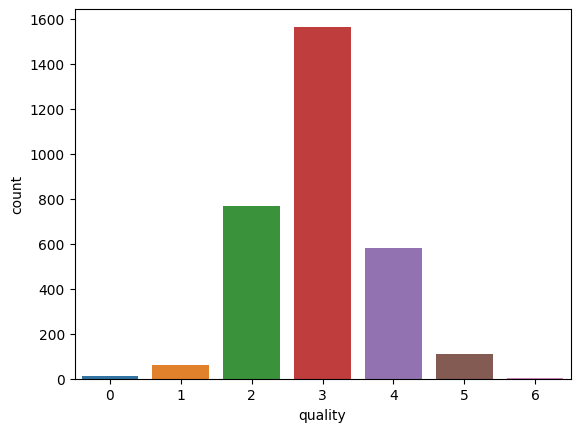

In [54]:
"""Visualizing the distribution of the values in quality column and determing the frequency 
   of each unique value"""

sns.countplot(data=wine_data, x="quality")

The quality feature values are heavily unbalanced. The dominant values are 2 and 3, 4, and the values 0, 1, 5 and 6 are almost absent from the set.

In [67]:
wine_data.corr()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,1.000000,-0.005258,0.269931,0.026333,0.055582,-0.081530,0.057819,0.215898,-0.395371,-0.010995,-0.102004,-0.095325
volatile acidity,-0.005258,1.000000,-0.025068,0.147815,0.011346,0.069448,0.205331,0.084254,-0.099199,-0.058630,0.002624,-0.176730
citric acid,0.269931,-0.025068,1.000000,0.020067,0.016375,0.018663,0.079545,0.084543,-0.130205,0.082036,-0.031214,-0.028522
residual sugar,0.026333,0.147815,0.020067,1.000000,0.273473,0.297591,0.408724,0.862179,-0.202174,-0.083115,-0.543610,-0.089588
chlorides,0.055582,0.011346,0.016375,0.273473,1.000000,0.139172,0.321680,0.453578,-0.011018,0.039218,-0.501303,-0.208161
free sulfur dioxide,-0.081530,0.069448,0.018663,0.297591,0.139172,1.000000,0.634443,0.295311,0.024726,0.068867,-0.239298,-0.003587
total sulfur dioxide,0.057819,0.205331,0.079545,0.408724,0.321680,0.634443,1.000000,0.521754,0.023939,0.085134,-0.432842,-0.135325
density,0.215898,0.084254,0.084543,0.862179,0.453578,0.295311,0.521754,1.000000,-0.077263,0.031982,-0.819864,-0.237990
pH,-0.395371,-0.099199,-0.130205,-0.202174,-0.011018,0.024726,0.023939,-0.077263,1.000000,0.150104,0.103560,0.059996
sulphates,-0.010995,-0.058630,0.082036,-0.083115,0.039218,0.068867,0.085134,0.031982,0.150104,1.000000,-0.011553,0.075587


In [57]:
"""Bar plot of the correlations between the quality column and the other columns in a Pandas DataFrame df.
   .quality.sort_values()[:-1] method selects all columns except the quality column and sorts them by 
   their correlation with quality.
   color_discrete_sequence is a parameter of the px.bar() function in plotly library that specifies a sequence 
   of colors to use for discrete values in the plot."""
   

wine_data_corr_bar = wine_data.corr().quality.sort_values()[:-1]
fig = px.bar(wine_data_corr_bar, orientation="h", color_discrete_sequence=["#446ccf"])
fig.update_layout(showlegend=False)
fig.show()

#For more color variation read https://encycolorpedia.com/722f37#:~:text=The%20color%20puce%20red%20with,%25%20saturation%20and%2032%25%20lightness.

1.The strongest correlation is with the trait alcohol (increases with an increase in quality) and density (decreases with an increase in quality).

2.Some traits (e.g. sulphates, free sulfur dioxide) show a low level of correlation with the trait quality.

# Feature Importance Graph

In [58]:
X = wine_data.drop(["quality"], axis=1)
y = wine_data["quality"]

In [59]:
"""The SelectKBest class selects the top k features based on a given scoring function. 
   In this case, score_func=f_classif specifies the f_classif scoring function, which computes 
   the ANOVA F-value between each feature and the target variable.
   The fit() method of the SelectKBest class fits the feature selector to the input data X and target variable y.
   The fs.scores_ attribute contains the scores assigned to each feature by the scoring function, and 
   the sum(fs.scores_) computes the total score across all features.
   The feature_contribution variable is a numpy array that contains the percentage contribution of each feature 
   to the total score, computed as (fs.scores_ / sum(fs.scores_)) * 100."""

fs = SelectKBest(score_func=f_classif, k="all")
fs.fit(X, y)
feature_contribution = (fs.scores_ / sum(fs.scores_)) * 100

fixed acidity : 3.85%
volatile acidity : 10.40%
citric acid : 0.66%
residual sugar : 4.60%
chlorides : 13.09%
free sulfur dioxide : 5.02%
total sulfur dioxide : 6.67%
density : 18.18%
pH : 1.18%
sulphates : 1.85%
alcohol : 34.48%


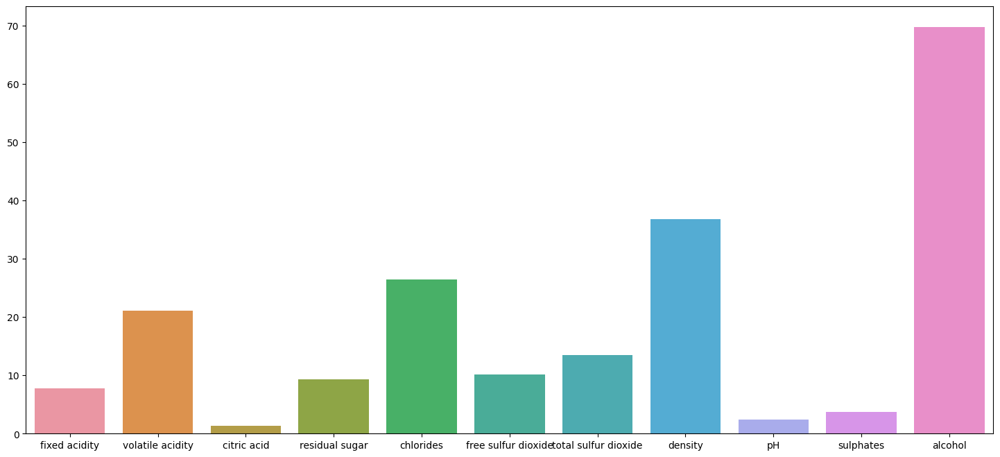

In [60]:
#Calculating feature score.
for i, j in enumerate(X.columns):
    print(f"{j} : {feature_contribution[i]:.2f}%")

plt.figure(figsize=(18, 8))
sns.barplot(x=X.columns, y=fs.scores_)
plt.show()

In [61]:
"""This suggests that the previous feature selection step using SelectKBest with the f_classif 
   scoring function identified these seven features as the most informative for predicting the target variable.
   This subset of features can be used to train a machine learning model with potentially improved 
   performance compared to using all of the original features, particularly if the original dataset contains 
   noisy or irrelevant features."""

X_fs = X[
    [
        "volatile acidity",
        "residual sugar",
        "chlorides",
        "total sulfur dioxide",
        "free sulfur dioxide",
        "density",
        "alcohol",
    ]
]

# Train/Test Split

Stratified sampling is a sampling method that ensures that each class in a dataset is represented in the training and test sets in the same proportions as they are in the overall dataset. Stratified sampling is often used in classification tasks, where the goal is to train a machine learning model to predict a categorical target variable.

In [62]:
#Test data size is 25%
X_train, X_test, y_train, y_test = train_test_split(
    X_fs, y, stratify=y, test_size=0.25, random_state=0)

# Data oversampling

<AxesSubplot: xlabel='quality', ylabel='count'>

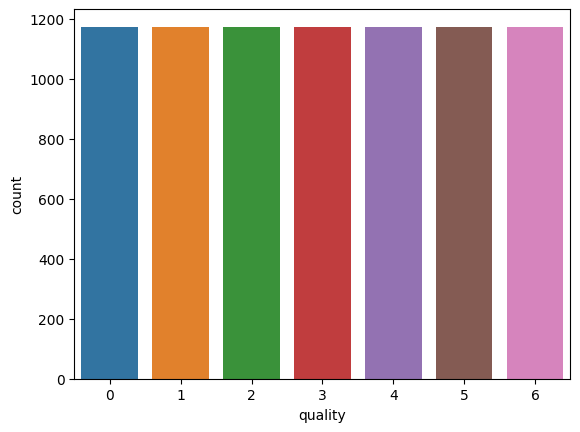

In [63]:
"""oversample is an instance of the RandomOverSampler class with a random seed of 0. 
   The fit_resample() method is used to resample the training data to balance the class distribution. 
   The resulting X_train and y_train arrays contain the resampled data.
   sns.countplot() function is used to plot the class distribution in the resampled training data. 
   This can be useful for verifying that the class distribution has been successfully balanced after oversampling."""

oversample = RandomOverSampler(random_state=0)
X_train, y_train = oversample.fit_resample(X_train, y_train)
sns.countplot(data=X_train, x=y_train)

As a result of RandomOverSampler oversampling, the number of observations is the same for all quality values

In [64]:
y_train.value_counts()

3    1174
1    1174
2    1174
4    1174
5    1174
0    1174
6    1174
Name: quality, dtype: int64

# Data Normalization

The data from the dataset have values with different scales. As a result, I decided to use normalization of these data to the [0, 1] scale. I used the same values obtained from the training set on the test set

In [65]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Model Training

I am using the following metrices to compare the quality of the models:

-Accuracy of the model

-Precision

-F1 score

-Sensitivity

-Cross validation accuracy

5 models used are:

-DecisionTreeClassifier

-RandomForestClassifier

-LinearRegression

-LogisticRegression

-XgBoost

-AdaBoost

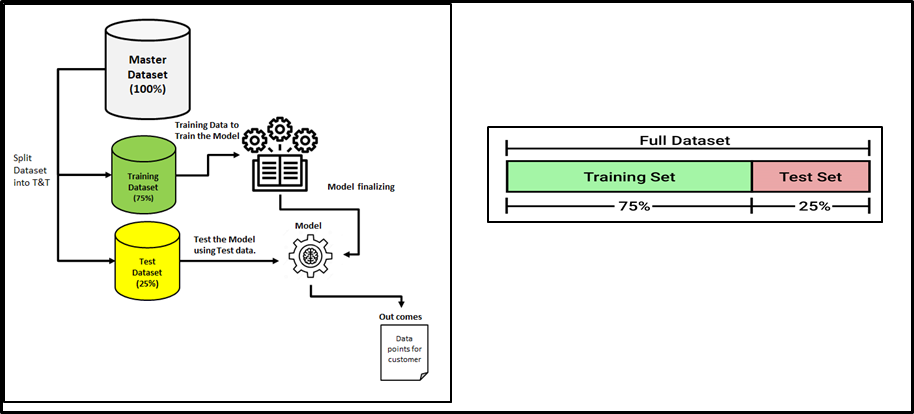

I use the default values of the hyperparameters (except random_state), as the effect of the hyperparameters on the accuracy of the model will be studied later.

In [66]:
models = [
    DecisionTreeClassifier(random_state=0),
    RandomForestClassifier(random_state=0),
    KNeighborsClassifier(),
    SVC(random_state=0),
    LogisticRegression(random_state=0),
    XGBClassifier(),
    AdaBoostClassifier(),
    GradientBoostingClassifier(),
]
models_comparison = {}

for model in models:
    print(f"Model: {str(model)}\n")
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracies = cross_val_score(estimator=model, X=X_train, y=y_train, cv=5)
    print(classification_report(y_test, y_pred))
    print("-" * 30, "\n")
    models_comparison[f"{str(model)}"] = [
        accuracy_score(y_pred, y_test),
        f1_score(y_pred, y_test, average="macro"),
        precision_score(y_pred, y_test, average="macro"),
        recall_score(y_pred, y_test, average="macro"),
        (accuracies.mean()),
    ]


Model: DecisionTreeClassifier(random_state=0)

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         3
           1       0.31      0.31      0.31        16
           2       0.58      0.59      0.59       192
           3       0.69      0.69      0.69       391
           4       0.54      0.53      0.53       145
           5       0.32      0.32      0.32        28
           6       0.00      0.00      0.00         1

    accuracy                           0.61       776
   macro avg       0.35      0.35      0.35       776
weighted avg       0.61      0.61      0.61       776

------------------------------ 

Model: RandomForestClassifier(random_state=0)

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         3
           1       0.67      0.25      0.36        16
           2       0.69      0.62      0.66       192
           3       0.68      0.80      0.73       391
     

In [27]:
"""models_com_df from the models_comparison dictionary. The DataFrame has five columns, 
   with column names "Model Accuracy", "Model F1-Score", "Precision", "Recall", and "CV Accuracy"."""

models_com_df = pd.DataFrame(models_comparison).T
models_com_df.columns = [
    "Model Accuracy",
    "Model F1-Score",
    "Precision",
    "Recall",
    "CV Accuracy",
]
models_com_df = models_com_df.sort_values(by="Model F1-Score", ascending=False)
models_com_df.style.format("{:.2%}").background_gradient(cmap="Blues")

,Model Accuracy,Model F1-Score,Precision,Recall,CV Accuracy
RandomForestClassifier(random_state=0),67.67%,46.38%,43.14%,52.24%,92.88%
"XGBClassifier(base_score=None, booster=None, callbacks=None, colsample_bylevel=None, colsample_bynode=None, colsample_bytree=None, early_stopping_rounds=None, enable_categorical=False, eval_metric=None, feature_types=None, gamma=None, gpu_id=None, grow_policy=None, importance_type=None, interaction_constraints=None, learning_rate=None, max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None, max_delta_step=None, max_depth=None, max_leaves=None, min_child_weight=None, missing=nan, monotone_constraints=None, n_estimators=100, n_jobs=None, num_parallel_tree=None, objective='multi:softprob', predictor=None, ...)",64.98%,41.64%,41.01%,42.38%,91.72%
DecisionTreeClassifier(random_state=0),58.69%,35.99%,36.43%,35.74%,90.88%
GradientBoostingClassifier(),51.59%,35.09%,41.58%,33.74%,79.79%
KNeighborsClassifier(),49.55%,31.23%,36.35%,29.72%,83.50%
SVC(random_state=0),40.33%,26.36%,37.05%,27.74%,64.28%
LogisticRegression(random_state=0),30.12%,19.65%,39.36%,24.12%,42.75%
AdaBoostClassifier(),14.45%,11.80%,18.77%,19.57%,33.75%
